# Jamie Clark
# CIS 700 Machine Learning and Cybersecurity


## Table of Contents
<ul>
<li><a href="#Data_prep">Data Preprocessing and Cleaning</a></li>
<li><a href="#Descriptive">Descriptive Analysis</a></li>
<li><a href="#Visualization">Visualization</a></li>
<li><a href="#Features">Feature Selections/Engineering</a></li>
<li><a href="#Clustering">Clustering</a></li>
<li><a href="#Classify">Classification/Prediction</a></li>
<li><a href="#Performance">Performance Analysis</a></li>
</ul>

My dataset is a list of nearly 18,000 job listings, of which, some are marked as fradulent. The goal will be to develop a method to be able to detect fradulent job postings. A side goal will be to find a scale to determine the confidence we have in saying a job posting is fradulent. 

Source: https://www.kaggle.com/shivamb/real-or-fake-fake-jobposting-prediction

We will begin by importing pandas, numpy and matplot lib to begin our analysis. We will also upload our csv file into a dataframe so that we may begin our analysis. Since we only received one file from Kaggle, we will need to perform a split of the data ourselves after preparing the data. 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb #currently not used
from matplotlib import pyplot as plt
import matplotlib.ticker as mtick
#verify that all of these get used
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB, ComplementNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate, ShuffleSplit, LeaveOneOut
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import tree #help visualize tree
from sklearn.metrics import plot_confusion_matrix
from sklearn.datasets import make_classification
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif, chi2
#from https://www.kaggle.com/shivamburnwal/nlp-98-acc-eda-with-model-using-spacy-pipeline
import missingno

#verify that all of these are actually used
#from: https://www.kaggle.com/madz2000/text-classification-using-keras-nb-97-accuracy
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelBinarizer
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize
from bs4 import BeautifulSoup
import re,string,unicodedata
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.stem import LancasterStemmer,WordNetLemmatizer
from string import punctuation
from nltk import pos_tag
from nltk.corpus import wordnet
#these will send warning messages if files have already been updated
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

%matplotlib inline
#random seed for reproducibility
np.random.seed(55)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jdcla\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\jdcla\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\jdcla\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
df = pd.read_csv('fake_job_postings.csv')

<a id='Data_prep'></a>
## Data Preprocessing and Cleaning

### Non-Text Data
Let's now take a look at what our dataset consists of and what each column type is.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   job_id               17880 non-null  int64 
 1   title                17880 non-null  object
 2   location             17534 non-null  object
 3   department           6333 non-null   object
 4   salary_range         2868 non-null   object
 5   company_profile      14572 non-null  object
 6   description          17879 non-null  object
 7   requirements         15185 non-null  object
 8   benefits             10670 non-null  object
 9   telecommuting        17880 non-null  int64 
 10  has_company_logo     17880 non-null  int64 
 11  has_questions        17880 non-null  int64 
 12  employment_type      14409 non-null  object
 13  required_experience  10830 non-null  object
 14  required_education   9775 non-null   object
 15  industry             12977 non-null  object
 16  func

We have 17,880 entries that come with 18 columns, most of which are objects. The columns that are listed as int64 are binary selections. We can also see that many columns do not have data filled in, so we will need to find a way to deal with these null values.

First, let's remove columns that will not help us starting out. This will be only job_id. We will modify other columns, such as salary_range, to become binary values later on. We will also preserve our original dataset, in case we need to come back and modify anything later. 

In [4]:
working_df = df.drop(columns=['job_id'])

Let's find out if there are any duplicated entries. We are doing this after removing job_id in the chance that a duplicated entry was assigned different job id's.

For the final report we have omited the deduplication process. This allows us to combine the text and non-text more efficiently. 281 rows out of nearly 18,000 entries is less then 2% and could very well be job posts posted twice. 

In [5]:
# start_rows = working_df.shape[0]
# working_df.drop_duplicates(keep='first', inplace=True)
# end_rows = working_df.shape[0]
# diff = start_rows - end_rows
# print(f'Deleted {diff} duplicate records.')

Let's take a look at the null values in the data.

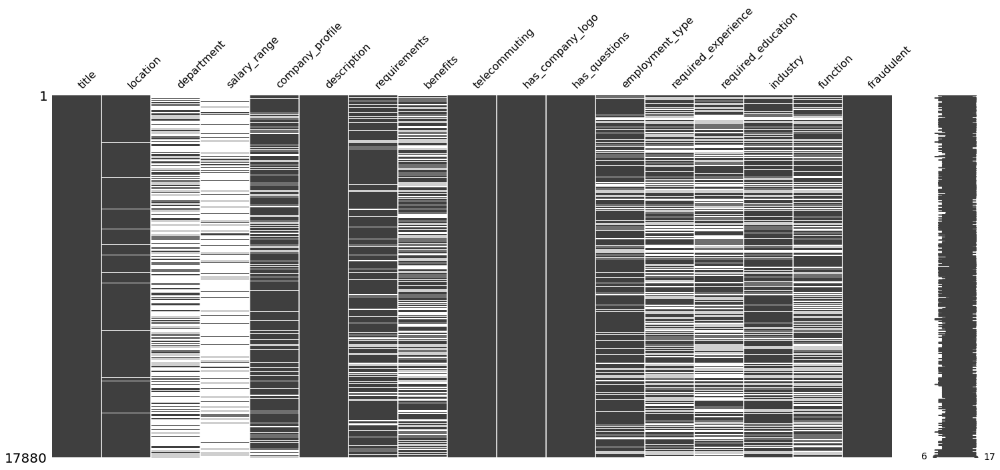

In [6]:
missingno.matrix(working_df);

Now we're going to take care of the columns where we want to know if its populated or not. Things like salary, department and requirements, for example. My assumption is that if a fradulent job posting wouldn't bother to put all this information into the fields. First, we will define our own function to output into a new column and then we will run through the columns we need to modify by creating a new column that is has_value.

In [7]:
def null_or_not(values):
    if pd.isna(values) == 1:
        return 0
    elif pd.isna(values) == 0:
        return 1

In [8]:
working_df['has_location'] = working_df['location'].apply(null_or_not)
working_df['has_department'] = working_df['department'].apply(null_or_not)
working_df['has_salary'] = working_df['salary_range'].apply(null_or_not)
working_df['has_profile'] = working_df['company_profile'].apply(null_or_not)
working_df['has_description'] = working_df['description'].apply(null_or_not)
working_df['has_requirements'] = working_df['requirements'].apply(null_or_not)
working_df['has_benefits'] = working_df['benefits'].apply(null_or_not)
working_df['has_industry'] = working_df['industry'].apply(null_or_not)

Let's take a look at the final output of the columns we have created. 

In [9]:
working_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   title                17880 non-null  object
 1   location             17534 non-null  object
 2   department           6333 non-null   object
 3   salary_range         2868 non-null   object
 4   company_profile      14572 non-null  object
 5   description          17879 non-null  object
 6   requirements         15185 non-null  object
 7   benefits             10670 non-null  object
 8   telecommuting        17880 non-null  int64 
 9   has_company_logo     17880 non-null  int64 
 10  has_questions        17880 non-null  int64 
 11  employment_type      14409 non-null  object
 12  required_experience  10830 non-null  object
 13  required_education   9775 non-null   object
 14  industry             12977 non-null  object
 15  function             11425 non-null  object
 16  frau

Now that we've tracked the columns that would require more data, let's remove the original columns. This should allow us to run a few machine learning functions with just the int64 data. We still have our original dataset maintained if we should decide to come back and look at this information in another way later. First we will list out the columns to delete, and then drop them out using a built in pandas function.

In [10]:
to_drop = ['location','department','salary_range','company_profile','description',
          'requirements','benefits','industry']
working_df = working_df.drop(columns=to_drop)

Now that we've removed duplicated information and made our some of our data easier to handle, let's move to quantifying our object values. This will allow us to perform analysis on them easier. Let's find good candidates for this process. We don't want there to be too many columns generated from this process. 

In [11]:
working_df.describe(include=[np.object])

,title,employment_type,required_experience,required_education,function
count,17880,14409,10830,9775,11425
unique,11231,5,7,13,37
top,English Teacher Abroad,Full-time,Mid-Senior level,Bachelor's Degree,Information Technology
freq,311,11620,3809,5145,1749


Since this is all we really have left, we will quantify the following columns: employment_type, required_experience, required_education and function. We won't do title because it has too many unique values and will unneccisarily increase our column count. We may be able to perform some text analysis on the title field later on, but for now, let's move forward with our choices.

In [12]:
quantify = ['employment_type','required_experience','required_education','function']
working_df = pd.get_dummies(data=working_df, columns=quantify)

Let's take a look at what our modified dataset looks like. 

In [13]:
working_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 75 columns):
 #   Column                                                Non-Null Count  Dtype 
---  ------                                                --------------  ----- 
 0   title                                                 17880 non-null  object
 1   telecommuting                                         17880 non-null  int64 
 2   has_company_logo                                      17880 non-null  int64 
 3   has_questions                                         17880 non-null  int64 
 4   fraudulent                                            17880 non-null  int64 
 5   has_location                                          17880 non-null  int64 
 6   has_department                                        17880 non-null  int64 
 7   has_salary                                            17880 non-null  int64 
 8   has_profile                                           17880 non-nu

In [14]:
final_df = working_df.copy()

The data should now be clean enough to run some machine learning algorithms on it. The next thing we will do is look at some descriptive statistics. However, since we have modified many of the columns, we will use our original dataset for our descriptive statistics.

Now let's clean and prepare the text data. No way that I'm doing this each time in this dataset. It takes way too long. So let's make this its own script and save it off to the side and pull it in when needed. 

### Text Data

Now we will do our cleaning and creation of our text data.

In [15]:
textdf = pd.read_csv("text_analysis.csv")

In [16]:
textdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   fraudulent  17880 non-null  int64 
 1   full_text   17880 non-null  object
dtypes: int64(1), object(1)
memory usage: 279.5+ KB


In [17]:
textdf.head(2)

,fraudulent,full_text
0,0,"marketing intern us, ny, new york marketing we..."
1,0,"customer service cloud video production nz, au..."


The next few sections are commented out because they were used to build the text analysis sets. Rather than continuously producing this information, we saved it as a csv and will load it in. The code is left behind in order to replicate results without having the created data files. 

In [18]:
# vectorizer200 = CountVectorizer(max_features=200)
# vectorizer1000 = CountVectorizer(max_features=1000)
# vectorizer2000 = CountVectorizer(max_features=2000)

In [19]:
# textVectorized200 = vectorizer200.fit_transform(textdf.full_text)
# textVectorized1000 = vectorizer1000.fit_transform(textdf.full_text)
# textVectorized2000 = vectorizer2000.fit_transform(textdf.full_text)

In [20]:
# TDF200 = pd.DataFrame(textVectorized200.toarray())
# TDF1000 = pd.DataFrame(textVectorized1000.toarray())
# TDF2000 = pd.DataFrame(textVectorized2000.toarray())

In [21]:
# TDF200.to_csv("TDF200.csv")
# TDF1000.to_csv("TDF1000.csv")
# TDF2000.to_csv("TDF2000.csv")

In [22]:
TDF200 = pd.read_csv('TDF200.csv')
TDF1000 = pd.read_csv('TDF1000.csv')
TDF2000 = pd.read_csv('TDF2000.csv')

<a id='Descriptive'></a>
## Descriptive Analysis

Let's take a look now at some descriptive features of our dataset. Since we don't have any continuous data to calculate values based on, these will mostly be counts of the values displayed. We will see, for each object based column, the count, the number of unique items, the top item and that number of occurences of the top value.

In [23]:
df.describe(include=[np.object])

,title,location,department,salary_range,company_profile,description,requirements,benefits,employment_type,required_experience,required_education,industry,function
count,17880,17534,6333,2868,14572,17879,15185,10670,14409,10830,9775,12977,11425
unique,11231,3105,1337,874,1709,14801,11968,6205,5,7,13,131,37
top,English Teacher Abroad,"GB, LND, London",Sales,0-0,We help teachers get safe &amp; secure jobs ab...,"Play with kids, get paid for it Love travel? J...",University degree required. TEFL / TESOL / CEL...,See job description,Full-time,Mid-Senior level,Bachelor's Degree,Information Technology and Services,Information Technology
freq,311,718,551,142,726,379,410,726,11620,3809,5145,1734,1749


<a id='Visualization'></a>
## Visualization

Again, we will do our visualizations based on the original data set. Since we do not have continuous data to analyze, we will be able to see some frequency analysis of the items we have.


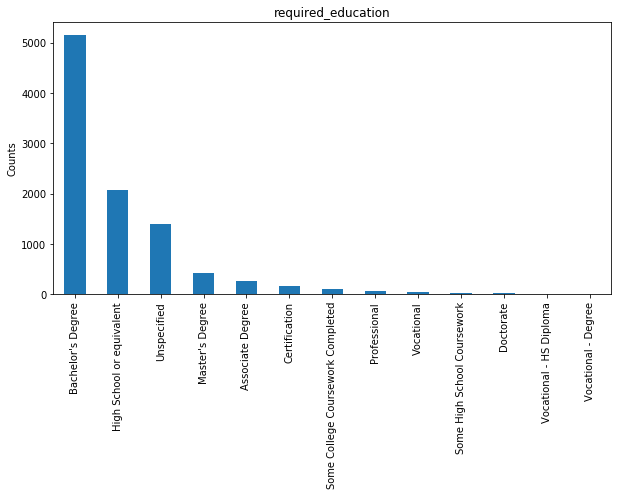

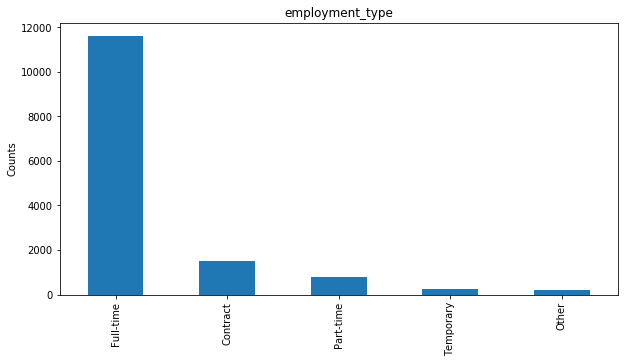

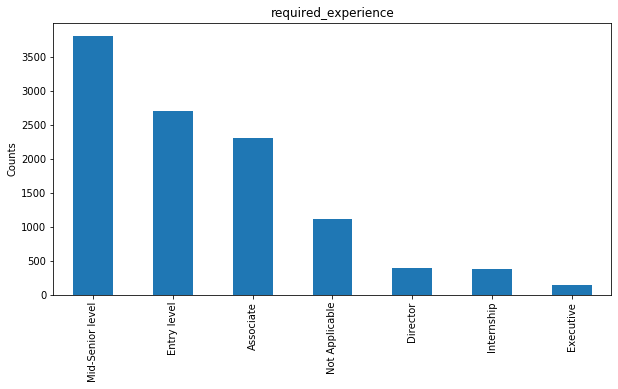

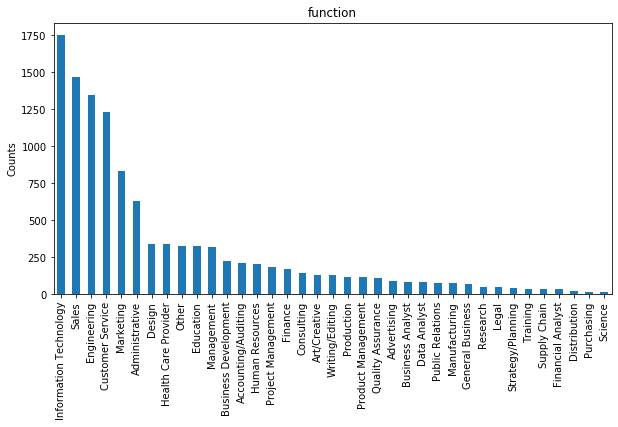

In [24]:
plots = ['required_education','employment_type','required_experience','function']
for col in plots:
    df[col].value_counts().plot(kind='bar', figsize=(10,5), title=col)
    plt.ylabel('Counts')
    plt.show()

In [25]:
# plots = ['required_education','employment_type','required_experience','function']
# for col in plots:
#     df[df.fraudulent == 1][col].value_counts().plot(kind='pie', figsize=(10,5), title=col)
#     plt.show()
#     df[df.fraudulent == 0][col].value_counts().plot(kind='pie', figsize=(10,5), title=col)
#     #plt.ylabel('Counts')
#     plt.show()

In [26]:
# fig,(ax1,ax2)= plt.subplots(ncols=2, figsize=(17, 10), dpi=200)
# #length=text_df[text_df["fraudulent"]==1]['description'].str.len()
# labelsax1 = df[df.fraudulent == 1]['required_education'].value_counts().index
# ax1.pie(df[df.fraudulent == 1]['required_education'].value_counts(),labels=labelsax1,autopct='%1.1f%%')
# ax1.set_title('Fake Post')
# #length=text_df[text_df["fraudulent"]==0]['description'].str.len()
# labelsax2 = df[df.fraudulent == 0]['required_education'].value_counts().index
# ax2.pie(df[df.fraudulent == 0]['required_education'].value_counts(),labels=labelsax2,autopct='%1.1f%%')
# ax2.set_title('Real Post')
# fig.suptitle('Required Education')
# plt.show()

In [27]:
# df[df.fraudulent == 1]['required_education'].value_counts().index

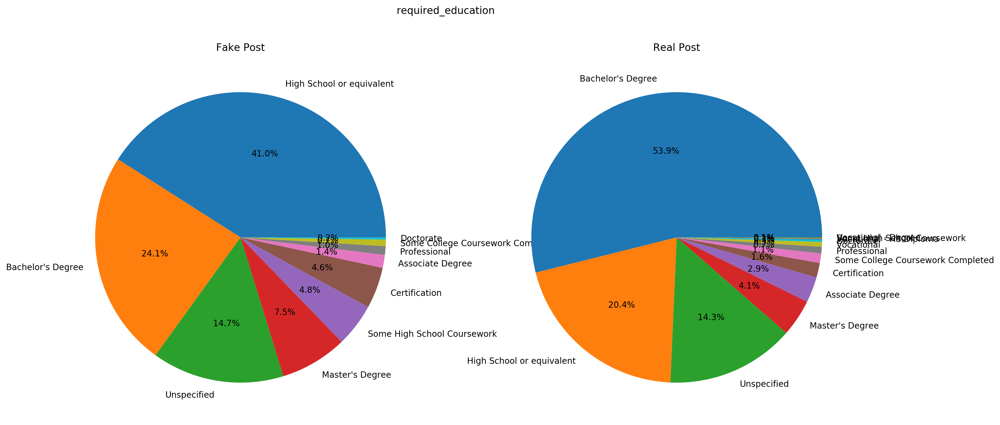

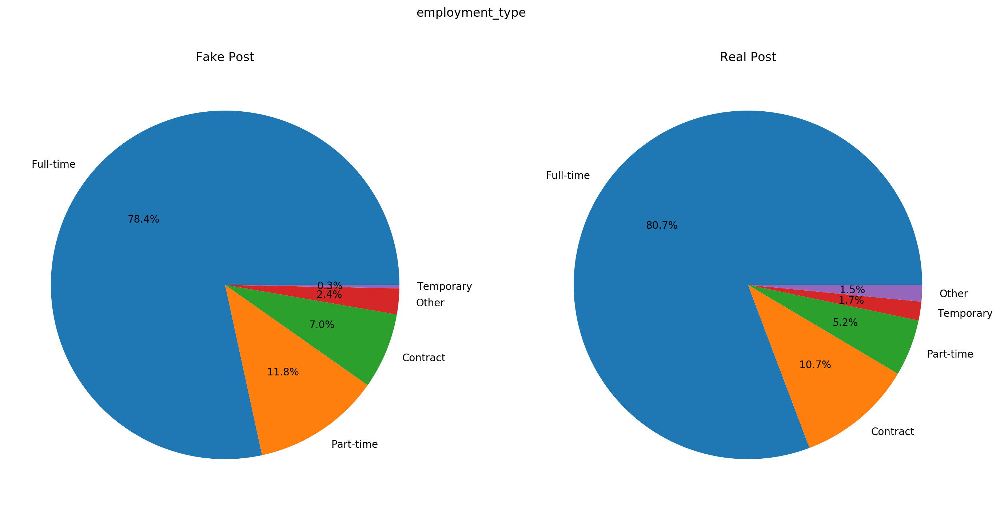

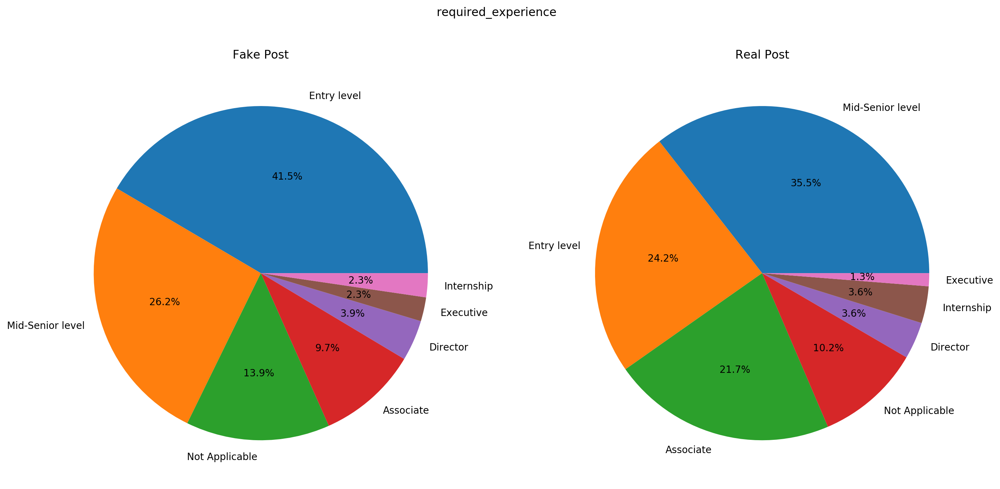

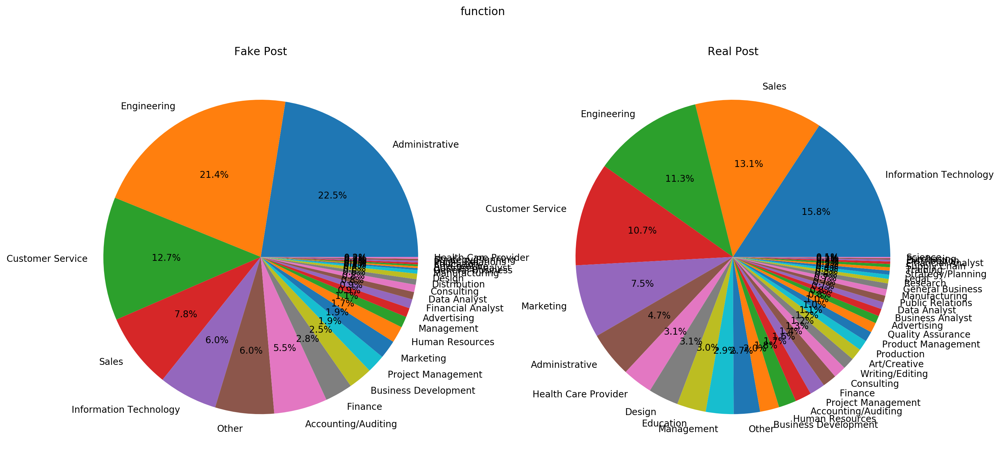

In [28]:
for col in plots:
    fig,(ax1,ax2)= plt.subplots(ncols=2, figsize=(17, 8), dpi=200)
    #length=text_df[text_df["fraudulent"]==1]['description'].str.len()
    labelsax1 = df[df.fraudulent == 1][col].value_counts().index
    ax1.pie(df[df.fraudulent == 1][col].value_counts(),labels=labelsax1,autopct='%1.1f%%')
    ax1.set_title('Fake Post')
    #length=text_df[text_df["fraudulent"]==0]['description'].str.len()
    labelsax2 = df[df.fraudulent == 0][col].value_counts().index
    ax2.pie(df[df.fraudulent == 0][col].value_counts(),labels=labelsax2,autopct='%1.1f%%')
    ax2.set_title('Real Post')
    fig.suptitle(col)
    plt.show()

<a id='Features'></a>
## Feature Selections/ Engineering

We have previously done all of our feature selection during our data cleaning/processing stage. Since we will be using all of the features that aren't text based in our analysis, we won't need to do any checks on this. We will be able to split the data into test and validations sets here though.

In [112]:
X = final_df.copy()
X = X.drop(columns=['title','fraudulent'])

In [113]:
y = final_df.fraudulent

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.35, random_state=10)

In [114]:
textX200_train, textX200_test, texty200_train, texty200_test = \
    train_test_split(TDF200, textdf.fraudulent, test_size=.35, random_state=10)
textX1000_train, textX1000_test, texty1000_train, texty1000_test = \
    train_test_split(TDF1000, textdf.fraudulent, test_size=.35, random_state=10)
textX2000_train, textX2000_test, texty2000_train, texty2000_test = \
    train_test_split(TDF2000, textdf.fraudulent, test_size=.35, random_state=10)

<a id='Clustering'></a>
## Clustering

### Non-Text Data
Here we will take our split dataset and perform a clustering algorithm on it. The clustering algorithm that we have selected is the KMeans algorithm. 

In [32]:
kmeans = KMeans(n_jobs=-1, random_state=1)
kmeans.fit(X_train,y_train)
kmeans_pred = kmeans.predict(X_test)
kmeans_default_acc = round(metrics.accuracy_score(y_test, kmeans_pred)*100, 2)
kmeans_default_roc = round(roc_auc_score(y_test, kmeans_pred)*100, 2)
print(f"The accuracy of the KMeans algorithm is {kmeans_default_acc}%.")
print(f"The ROC of the KMeans algorithm is {kmeans_default_roc}.")

The accuracy of the KMeans algorithm is 18.18%.
The ROC of the KMeans algorithm is 49.89.


In [81]:
centroids = kmeans.cluster_centers_
print(centroids)
print(centroids.size)

[[0.03942896 0.89191027 0.43575799 ... 0.15635622 0.84364378 0.08973487]
 [0.04433834 0.69781719 0.39699864 ... 0.11800819 0.63915416 0.05252387]
 [0.04680851 0.78723404 0.54680851 ... 0.12198582 0.79078014 0.0964539 ]
 ...
 [0.05202703 0.80878378 0.56554054 ... 0.15472973 0.71891892 0.08445946]
 [0.0422252  0.79892761 0.45442359 ... 0.15951743 0.90147453 0.07372654]
 [0.04030055 0.73770492 0.57718579 ... 0.13456284 0.68715847 0.08128415]]
8592


### Text Data
Here we will do the clustering algorithm on our text data.


In [33]:
#200
kmeans = KMeans(n_jobs=-1, random_state=1)
kmeans.fit(textX200_train,texty200_train)
kmeans_pred_text200 = kmeans.predict(textX200_test)
kmeans_default_acc_text200 = round(metrics.accuracy_score(texty200_test, kmeans_pred_text200)*100, 2)
kmeans_default_roc_text200 = round(roc_auc_score(texty200_test, kmeans_pred_text200)*100, 2)
print(f"The accuracy of the KMeans algorithm is {kmeans_default_acc_text200}%.")
print(f"The ROC of the KMeans algorithm is {kmeans_default_roc_text200}.")

The accuracy of the KMeans algorithm is 14.49%.
The ROC of the KMeans algorithm is 45.36.


In [34]:
#1000
kmeans = KMeans(n_jobs=-1, random_state=1)
kmeans.fit(textX1000_train,texty1000_train)
kmeans_pred_text1000 = kmeans.predict(textX1000_test)
kmeans_default_acc_text1000 = round(metrics.accuracy_score(texty1000_test, kmeans_pred_text1000)*100, 2)
kmeans_default_roc_text1000 = round(roc_auc_score(y_test, kmeans_pred)*100, 2)
print(f"The accuracy of the KMeans algorithm is {kmeans_default_acc_text1000}%.")
print(f"The ROC of the KMeans algorithm is {kmeans_default_roc_text1000}.")

The accuracy of the KMeans algorithm is 14.49%.
The ROC of the KMeans algorithm is 49.89.


In [35]:
#2000
kmeans = KMeans(n_jobs=-1, random_state=1)
kmeans.fit(textX2000_train,texty2000_train)
kmeans_pred_text2000 = kmeans.predict(textX2000_test)
kmeans_default_acc_text2000 = round(metrics.accuracy_score(texty2000_test, kmeans_pred_text2000)*100, 2)
kmeans_default_roc_text2000 = round(roc_auc_score(y_test, kmeans_pred)*100, 2)
print(f"The accuracy of the KMeans algorithm is {kmeans_default_acc_text2000}%.")
print(f"The ROC of the KMeans algorithm is {kmeans_default_roc_text2000}.")

The accuracy of the KMeans algorithm is 14.49%.
The ROC of the KMeans algorithm is 49.89.


<a id='Classify'></a>
## Classification and Prediction

We will be using several different algorithms to predict whether or not the job posting is fradulent. We will list their accuracies and then compare the performances in the next section. Since we do not have a separate dataset to officially test to, we will only use our train and test datasets here. This will allow us to grab different batches of data using Train_test_split and show that our accuracy remains stable.

We will run the following algorithms and capture their accuracies. Decision Tree Classifier, Nearest Neighbors Classifier, Naive Bayes (Gaussian, Bernoulli and Multinomial), Random Forest Classifier and Gradient Boosting Classifier.

In [91]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc_pred = dtc.predict(X_test)
dtc_default_acc = round(metrics.accuracy_score(y_test, dtc_pred)*100, 2)
dtc_default_roc = round(roc_auc_score(y_test, dtc_pred), 4)
print(f"The accuracy of the Decision Tree Classifier is {dtc_default_acc}%.")
print(f"The ROC of the Decision Tree Classifier is {dtc_default_roc}.")

The accuracy of the Decision Tree Classifier is 96.13%.
The ROC of the Decision Tree Classifier is 0.7268.


In [96]:
from io import StringIO
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image 

In [97]:
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = list(X),class_names=['Real','Fraud'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('final_tree.png')
Image(graph.create_png())

In [100]:
neigh = KNeighborsClassifier(n_jobs=-1)
neigh.fit(X_train,y_train)
neigh_pred = neigh.predict(X_test)
neigh_default_acc = round(metrics.accuracy_score(y_test, neigh_pred)*100, 2)
neigh_default_roc = round(roc_auc_score(y_test, neigh_pred), 4)
print(f"The accuracy of the Nearest Neighbors Classifier is {neigh_default_acc}%.")
print(f"The ROC of the Nearest Neighbors Classifier is {neigh_default_roc}.")

The accuracy of the Nearest Neighbors Classifier is 96.09%.
The ROC of the Nearest Neighbors Classifier is 0.7265.


In [103]:
gnb = GaussianNB()
gnb.fit(X_train,y_train)
gnb_pred = gnb.predict(X_test)
gnb_acc = round(metrics.accuracy_score(y_test, gnb_pred)*100, 2)
gnb_roc = round(roc_auc_score(y_test, gnb_pred), 4)
print(f"The accuracy of the Gaussian Naive Bayes is {gnb_acc}%.")
print(f"The ROC of the Gaussian Naive Bayes is {gnb_roc}.")


The accuracy of the Gaussian Naive Bayes is 14.35%.
The ROC of the Gaussian Naive Bayes is 0.5345.


In [40]:

bnb = BernoulliNB()
bnb.fit(X_train,y_train)
bnb_pred = bnb.predict(X_test)
bnb_acc = round(metrics.accuracy_score(y_test, bnb_pred)*100, 2)
bnb_roc = round(roc_auc_score(y_test, bnb_pred), 4)
print(f"The accuracy of the Bernoulli Naive Bayes is {bnb_acc}%.")
print(f"The ROC of the Bernoulli Naive Bayes is {bnb_roc}.")



The accuracy of the Bernoulli Naive Bayes is 93.94%.
The ROC of the Bernoulli Naive Bayes is 0.7072.


In [41]:
mnb = MultinomialNB()
mnb.fit(X_train,y_train)
mnb_pred = mnb.predict(X_test)
mnb_acc = round(metrics.accuracy_score(y_test, mnb_pred)*100, 2)
mnb_roc = round(roc_auc_score(y_test, mnb_pred), 4)
print(f"The accuracy of the Multinomial Naive Bayes is {mnb_acc}%.")
print(f"The ROC of the Multinomial Naive Bayes is {mnb_roc}.")

The accuracy of the Multinomial Naive Bayes is 95.37%.
The ROC of the Multinomial Naive Bayes is 0.5407.


In [110]:
rfor = RandomForestClassifier(n_jobs=-1)
rfor.fit(X_train,y_train)
rfor_pred = rfor.predict(X_test)
rfor_default_acc = round(metrics.accuracy_score(y_test, rfor_pred)*100, 2)
rfor_default_roc = round(roc_auc_score(y_test, rfor_pred), 4)
print(f"The accuracy of the Random Forest Classifier is {rfor_default_acc}%.")
print(f"The ROC of the Random Forest Classifier is {rfor_default_roc}.")

The accuracy of the Random Forest Classifier is 96.8%.
The ROC of the Random Forest Classifier is 0.7319.


In [43]:
gbc = GradientBoostingClassifier(random_state=1,warm_start=True)
gbc.fit(X_train,y_train)
gbc_pred = gbc.predict(X_test)
gbc_default_acc = round(metrics.accuracy_score(y_test, gbc_pred)*100, 2)
gbc_default_roc = round(roc_auc_score(y_test, gbc_pred), 4)
print(f"The accuracy of the Gradient Boosting Classifier is {gbc_default_acc}%.")
print(f"The ROC of the Gradient Boosting Classifier is {gbc_default_roc}.")

The accuracy of the Gradient Boosting Classifier is 96.15%.
The ROC of the Gradient Boosting Classifier is 0.6173.


### Text Data

Now let's look at the text data again.

In [44]:
#200
dtc = DecisionTreeClassifier()
dtc.fit(textX200_train, texty200_train)
dtc_pred_text200 = dtc.predict(textX200_test)
dtc_default_acc_text200 = round(metrics.accuracy_score(texty200_test, dtc_pred_text200)*100, 2)
dtc_default_roc_text200 = round(roc_auc_score(texty200_test, dtc_pred_text200), 4)
print(f"The accuracy of the Decision Tree Classifier with 200 words is {dtc_default_acc_text200}%.")
print(f"The ROC of the Decision Tree Classifier with 200 words is {dtc_default_roc_text200}.")

The accuracy of the Decision Tree Classifier with 200 words is 96.66%.
The ROC of the Decision Tree Classifier with 200 words is 0.8471.


In [45]:
#1000
dtc = DecisionTreeClassifier()
dtc.fit(textX1000_train, texty1000_train)
dtc_pred_text1000 = dtc.predict(textX1000_test)
dtc_default_acc_text1000 = round(metrics.accuracy_score(texty1000_test, dtc_pred_text1000)*100, 2)
dtc_default_roc_text1000 = round(roc_auc_score(texty1000_test, dtc_pred_text1000), 4)
print(f"The accuracy of the Decision Tree Classifier with 1000 words is {dtc_default_acc_text1000}%.")
print(f"The ROC of the Decision Tree Classifier with 1000 words is {dtc_default_roc_text1000}.")

The accuracy of the Decision Tree Classifier with 1000 words is 97.48%.
The ROC of the Decision Tree Classifier with 1000 words is 0.8788.


In [46]:
#2000
dtc = DecisionTreeClassifier()
dtc.fit(textX2000_train, texty2000_train)
dtc_pred_text2000 = dtc.predict(textX2000_test)
dtc_default_acc_text2000 = round(metrics.accuracy_score(texty2000_test, dtc_pred_text2000)*100, 2)
dtc_default_roc_text2000 = round(roc_auc_score(texty2000_test, dtc_pred_text2000), 4)
print(f"The accuracy of the Decision Tree Classifier with 2000 words is {dtc_default_acc_text2000}%.")
print(f"The ROC of the Gradient Boosting Classifier with 2000 words is {dtc_default_roc_text2000}.")

The accuracy of the Decision Tree Classifier with 2000 words is 97.57%.
The ROC of the Gradient Boosting Classifier with 2000 words is 0.8745.


In [47]:
neigh = KNeighborsClassifier(n_jobs=-1)
neigh.fit(textX200_train, texty200_train)
neigh_pred_text200 = neigh.predict(textX200_test)
neigh_default_acc_text200 = round(metrics.accuracy_score(texty200_test, neigh_pred_text200)*100, 2)
neigh_default_roc_text200 = round(roc_auc_score(texty200_test, neigh_pred_text200), 4)
print(f"The accuracy of the Nearest Neighbor Classifier with 200 words is {neigh_default_acc_text200}%.")
print(f"The ROC of the Gradient Boosting Classifier with 200 words is {neigh_default_roc_text200}.")

The accuracy of the Nearest Neighbor Classifier with 200 words is 97.08%.
The ROC of the Gradient Boosting Classifier with 200 words is 0.7575.


In [48]:
neigh = KNeighborsClassifier(n_jobs=-1)
neigh.fit(textX1000_train, texty1000_train)
neigh_pred_text1000 = neigh.predict(textX1000_test)
neigh_default_acc_text1000 = round(metrics.accuracy_score(texty1000_test, neigh_pred_text1000)*100, 2)
neigh_default_roc_text1000 = round(roc_auc_score(texty1000_test, neigh_pred_text1000), 4)
print(f"The accuracy of the Nearest Neighbor Classifier with 1000 words is {neigh_default_acc_text1000}%.")
print(f"The ROC of the Gradient Boosting Classifier with 1000 words is {neigh_default_roc_text1000}.")

The accuracy of the Nearest Neighbor Classifier with 1000 words is 97.06%.
The ROC of the Gradient Boosting Classifier with 1000 words is 0.7606.


In [49]:
neigh = KNeighborsClassifier(n_jobs=-1)
neigh.fit(textX2000_train, texty2000_train)
neigh_pred_text2000 = neigh.predict(textX2000_test)
neigh_default_acc_text2000 = round(metrics.accuracy_score(texty2000_test, neigh_pred_text2000)*100, 2)
neigh_default_roc_text2000 = round(roc_auc_score(texty2000_test, neigh_pred_text2000), 4)
print(f"The accuracy of the Nearest Neighbor Classifier with 2000 words is {neigh_default_acc_text2000}%.")
print(f"The ROC of the Gradient Boosting Classifier with 2000 words is {neigh_default_roc_text2000}.")

The accuracy of the Nearest Neighbor Classifier with 2000 words is 97.01%.
The ROC of the Gradient Boosting Classifier with 2000 words is 0.7588.


In [50]:
gnb = GaussianNB()
gnb.fit(textX200_train,texty200_train)
gnb_pred_text200 = gnb.predict(textX200_test)
gnb_acc_text200 = round(metrics.accuracy_score(texty200_test, gnb_pred_text200)*100, 2)
gnb_roc_text200 = round(roc_auc_score(texty200_test, gnb_pred_text200), 4)
print(f"The accuracy of the Gaussian Naive Bayes with 200 words is {gnb_acc_text200}%.")
print(f"The ROC of the Gaussian Naive Bayes with 200 words is {gnb_roc_text200}.")

The accuracy of the Gaussian Naive Bayes with 200 words is 65.52%.
The ROC of the Gaussian Naive Bayes with 200 words is 0.7756.


In [51]:
gnb = GaussianNB()
gnb.fit(textX1000_train,texty1000_train)
gnb_pred_text1000 = gnb.predict(textX1000_test)
gnb_acc_text1000 = round(metrics.accuracy_score(texty1000_test, gnb_pred_text1000)*100, 2)
gnb_roc_text1000 = round(roc_auc_score(texty1000_test, gnb_pred_text1000), 4)
print(f"The accuracy of the Gaussian Naive Bayes with 1000 words is {gnb_acc_text1000}%.")
print(f"The ROC of the Gaussian Naive Bayes with 1000 words is {gnb_roc_text1000}.")

The accuracy of the Gaussian Naive Bayes with 1000 words is 69.69%.
The ROC of the Gaussian Naive Bayes with 1000 words is 0.8103.


In [52]:
gnb = GaussianNB()
gnb.fit(textX2000_train,texty2000_train)
gnb_pred_text2000 = gnb.predict(textX2000_test)
gnb_acc_text2000 = round(metrics.accuracy_score(texty2000_test, gnb_pred_text2000)*100, 2)
gnb_roc_text2000 = round(roc_auc_score(texty2000_test, gnb_pred_text2000), 4)
print(f"The accuracy of the Gaussian Naive Bayes with 2000 words is {gnb_acc_text2000}%.")
print(f"The ROC of the Gaussian Naive Bayes with 2000 words is {gnb_roc_text2000}.")

The accuracy of the Gaussian Naive Bayes with 2000 words is 63.41%.
The ROC of the Gaussian Naive Bayes with 2000 words is 0.779.


In [53]:
bnb = BernoulliNB()
bnb.fit(textX200_train,texty200_train)
bnb_pred_text200 = bnb.predict(textX200_test)
bnb_acc_text200 = round(metrics.accuracy_score(texty200_test, bnb_pred_text200)*100, 2)
bnb_roc_text200 = round(roc_auc_score(texty200_test, bnb_pred_text200), 4)
print(f"The accuracy of the Bernoulli Naive Bayes with 200 words is {bnb_acc_text200}%.")
print(f"The ROC of the Bernoulli Naive Bayes with 200 words is {bnb_roc_text200}.")

The accuracy of the Bernoulli Naive Bayes with 200 words is 77.39%.
The ROC of the Bernoulli Naive Bayes with 200 words is 0.7347.


In [54]:
bnb = BernoulliNB()
bnb.fit(textX1000_train,texty1000_train)
bnb_pred_text1000 = bnb.predict(textX1000_test)
bnb_acc_text1000 = round(metrics.accuracy_score(texty1000_test, bnb_pred_text1000)*100, 2)
bnb_roc_text1000 = round(roc_auc_score(texty1000_test, bnb_pred_text1000), 4)
print(f"The accuracy of the Bernoulli Naive Bayes with 200 words is {bnb_acc_text1000}%.")
print(f"The ROC of the Bernoulli Naive Bayes with 200 words is {bnb_roc_text1000}.")

The accuracy of the Bernoulli Naive Bayes with 200 words is 83.84%.
The ROC of the Bernoulli Naive Bayes with 200 words is 0.8379.


In [55]:
bnb = BernoulliNB()
bnb.fit(textX2000_train,texty2000_train)
bnb_pred_text2000 = bnb.predict(textX2000_test)
bnb_acc_text2000 = round(metrics.accuracy_score(texty2000_test, bnb_pred_text2000)*100, 2)
bnb_roc_text2000 = round(roc_auc_score(texty2000_test, bnb_pred_text2000), 4)
print(f"The accuracy of the Bernoulli Naive Bayes with 200 words is {bnb_acc_text2000}%.")
print(f"The ROC of the Bernoulli Naive Bayes with 200 words is {bnb_roc_text2000}.")

The accuracy of the Bernoulli Naive Bayes with 200 words is 85.65%.
The ROC of the Bernoulli Naive Bayes with 200 words is 0.8715.


In [56]:
mnb = MultinomialNB()
mnb.fit(textX200_train,texty200_train)
mnb_pred_text200 = mnb.predict(textX200_test)
mnb_acc_text200 = round(metrics.accuracy_score(texty200_test, mnb_pred_text200)*100, 2)
mnb_roc_text200 = round(roc_auc_score(texty200_test, mnb_pred_text200), 4)
print(f"The accuracy of the Multinomial Naive Bayes with 200 words is {mnb_acc_text200}%.")
print(f"The ROC of the Multinomial Naive Bayes with 200 words is {mnb_roc_text200}.")

The accuracy of the Multinomial Naive Bayes with 200 words is 69.19%.
The ROC of the Multinomial Naive Bayes with 200 words is 0.6788.


In [57]:
mnb = MultinomialNB()
mnb.fit(textX1000_train,texty1000_train)
mnb_pred_text1000 = mnb.predict(textX1000_test)
mnb_acc_text1000 = round(metrics.accuracy_score(texty1000_test, mnb_pred_text1000)*100, 2)
mnb_roc_text1000 = round(roc_auc_score(texty1000_test, mnb_pred_text1000), 4)
print(f"The accuracy of the Multinomial Naive Bayes with 1000 words is {mnb_acc_text1000}%.")
print(f"The ROC of the Multinomial Naive Bayes with 1000 words is {mnb_roc_text1000}.")

The accuracy of the Multinomial Naive Bayes with 1000 words is 75.55%.
The ROC of the Multinomial Naive Bayes with 1000 words is 0.7428.


In [58]:
mnb = MultinomialNB()
mnb.fit(textX2000_train,texty2000_train)
mnb_pred_text2000 = mnb.predict(textX2000_test)
mnb_acc_text2000 = round(metrics.accuracy_score(texty2000_test, mnb_pred_text2000)*100, 2)
mnb_roc_text2000 = round(roc_auc_score(texty2000_test, mnb_pred_text2000), 4)
print(f"The accuracy of the Multinomial Naive Bayes with 2000 words is {mnb_acc_text2000}%.")
print(f"The ROC of the Multinomial Naive Bayes with 2000 words is {mnb_roc_text2000}.")

The accuracy of the Multinomial Naive Bayes with 2000 words is 78.78%.
The ROC of the Multinomial Naive Bayes with 2000 words is 0.7791.


## Ensemble

In [59]:
rfor = RandomForestClassifier(n_jobs=-1)
rfor.fit(textX200_train,texty200_train)
rfor_pred_text200 = rfor.predict(textX200_test)
rfor_default_acc_text200 = round(metrics.accuracy_score(texty200_test, rfor_pred_text200)*100, 2)
rfor_default_roc_text200 = round(roc_auc_score(texty200_test, rfor_pred_text200), 4)
print(f"The accuracy of the Random Forest Classifier with 200 words is {rfor_default_acc_text200}%.")
print(f"The ROC of the Random Forest Classifier with 200 words is {rfor_default_roc_text200}.")

The accuracy of the Random Forest Classifier with 200 words is 98.13%.
The ROC of the Random Forest Classifier with 200 words is 0.8049.


In [60]:
rfor = RandomForestClassifier(n_jobs=-1)
rfor.fit(textX1000_train,texty1000_train)
rfor_pred_text1000 = rfor.predict(textX1000_test)
rfor_default_acc_text1000 = round(metrics.accuracy_score(texty1000_test, rfor_pred_text1000)*100, 2)
rfor_default_roc_text1000 = round(roc_auc_score(texty1000_test, rfor_pred_text1000), 4)
print(f"The accuracy of the Random Forest Classifier with 1000 words is {rfor_default_acc_text1000}%.")
print(f"The ROC of the Random Forest Classifier with 1000 words is {rfor_default_roc_text1000}.")

The accuracy of the Random Forest Classifier with 1000 words is 98.26%.
The ROC of the Random Forest Classifier with 1000 words is 0.8153.


In [61]:
rfor = RandomForestClassifier(n_jobs=-1)
rfor.fit(textX2000_train,texty2000_train)
rfor_pred_text2000 = rfor.predict(textX2000_test)
rfor_default_acc_text2000 = round(metrics.accuracy_score(texty2000_test, rfor_pred_text2000)*100, 2)
rfor_default_roc_text2000 = round(roc_auc_score(texty2000_test, rfor_pred_text2000), 4)
print(f"The accuracy of the Random Forest Classifier with 2000 words is {rfor_default_acc_text2000}%.")
print(f"The ROC of the Random Forest Classifier with 2000 words is {rfor_default_roc_text2000}.")

The accuracy of the Random Forest Classifier with 2000 words is 98.16%.
The ROC of the Random Forest Classifier with 2000 words is 0.8051.


In [62]:
gbc = GradientBoostingClassifier(random_state=1,warm_start=True)
gbc.fit(textX200_train,texty200_train)
gbc_pred_text200 = gbc.predict(textX200_test)
gbc_default_acc_text200 = round(metrics.accuracy_score(texty200_test, gbc_pred_text200)*100, 2)
gbc_default_roc_text200 = round(roc_auc_score(texty200_test, gbc_pred_text200), 4)
print(f"The accuracy of the Gradient Boosting Classifier with 200 words is {gbc_default_acc_text200}%.")
print(f"The ROC of the Gradient Boosting Classifier with 200 words is {gbc_default_roc_text200}.")

The accuracy of the Gradient Boosting Classifier with 200 words is 97.73%.
The ROC of the Gradient Boosting Classifier with 200 words is 0.7674.


In [63]:
gbc = GradientBoostingClassifier(random_state=1,warm_start=True)
gbc.fit(textX1000_train,texty1000_train)
gbc_pred_text1000 = gbc.predict(textX1000_test)
gbc_default_acc_text1000 = round(metrics.accuracy_score(texty1000_test, gbc_pred_text200)*100, 2)
gbc_default_roc_text1000 = round(roc_auc_score(texty1000_test, gbc_pred_text1000), 4)
print(f"The accuracy of the Gradient Boosting Classifier with 1000 words is {gbc_default_acc_text1000}%.")
print(f"The ROC of the Gradient Boosting Classifier with 1000 words is {gbc_default_roc_text1000}.")

The accuracy of the Gradient Boosting Classifier with 1000 words is 97.73%.
The ROC of the Gradient Boosting Classifier with 1000 words is 0.8232.


In [64]:
gbc = GradientBoostingClassifier(random_state=1,warm_start=True)
gbc.fit(textX2000_train,texty2000_train)
gbc_pred_text2000 = gbc.predict(textX2000_test)
gbc_default_acc_text2000 = round(metrics.accuracy_score(texty2000_test, gbc_pred_text2000)*100, 2)
gbc_default_roc_text2000 = round(roc_auc_score(texty2000_test, gbc_pred_text2000), 4)
print(f"The accuracy of the Gradient Boosting Classifier with 2000 words is {gbc_default_acc_text2000}%.")
print(f"The ROC of the Gradient Boosting Classifier with 2000 words is {gbc_default_roc_text2000}.")

The accuracy of the Gradient Boosting Classifier with 2000 words is 98.18%.
The ROC of the Gradient Boosting Classifier with 2000 words is 0.8229.


In [65]:
ada = AdaBoostClassifier(random_state=1, n_estimators=1000)
ada.fit(X_train,y_train)
ada_pred = ada.predict(X_test)
ada_default_acc = round(metrics.accuracy_score(y_test, ada_pred)*100, 2)
ada_default_roc = round(roc_auc_score(y_test, ada_pred), 4)
print(f"The accuracy of the AdaBoost Classifier is {ada_default_acc}%.")
print(f"The ROC of the AdaBoost Classifier is {ada_default_roc}.")

The accuracy of the AdaBoost Classifier is 95.19%.
The ROC of the AdaBoost Classifier is 0.5768.


## Combine Data

In [66]:
#1000 seems to be the best one to use
combined = X.join(TDF1000, how='outer')

In [67]:
combined_train, combined_test, combinedy_train, combinedy_test = train_test_split(
    combined, y, test_size=.35, random_state=10)

In [98]:
dtc = DecisionTreeClassifier()
dtc.fit(combined_train,combinedy_train)
dtc_pred_combined = dtc.predict(combined_test)
dtc_default_acc_combined = round(metrics.accuracy_score(combinedy_test, dtc_pred_combined)*100, 2)
dtc_default_roc_combined = round(roc_auc_score(combinedy_test, dtc_pred_combined), 4)
print(f"The accuracy of the Decision Tree Classifier is {dtc_default_acc_combined}%.")
print(f"The ROC of the Decision Tree Classifier is {dtc_default_roc_combined}.")

The accuracy of the Decision Tree Classifier is 97.86%.
The ROC of the Decision Tree Classifier is 0.8905.


In [99]:
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = list(combined),class_names=['Real','Fraud'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('final_tree_combined.png')
Image(graph.create_png())

In [69]:
kmeans = KMeans(n_jobs=-1, random_state=1)
kmeans.fit(combined_train,combinedy_train)
kmeans_pred_combined = kmeans.predict(combined_test)
kmeans_default_acc_combined = round(metrics.accuracy_score(combinedy_test, kmeans_pred_combined)*100, 2)
kmeans_default_roc_combined = round(roc_auc_score(combinedy_test, kmeans_pred_combined), 4)
print(f"The accuracy of the KMeans algorithm is {kmeans_default_acc_combined}%.")
print(f"The ROC of the KMeans algorithm is {kmeans_default_roc_combined}.")

The accuracy of the KMeans algorithm is 14.49%.
The ROC of the KMeans algorithm is 0.4544.


In [70]:
neigh = KNeighborsClassifier(n_jobs=-1)
neigh.fit(combined_train,combinedy_train)
neigh_pred_combined = neigh.predict(combined_test)
neigh_default_acc_combined = round(metrics.accuracy_score(combinedy_test, neigh_pred_combined)*100, 2)
neigh_default_roc_combined = round(roc_auc_score(combinedy_test, neigh_pred_combined), 4)
print(f"The accuracy of the Nearest Neighbors Classifier is {neigh_default_acc_combined}%.")
print(f"The ROC of the Nearest Neighbors Classifier is {neigh_default_roc_combined}.")

The accuracy of the Nearest Neighbors Classifier is 97.06%.
The ROC of the Nearest Neighbors Classifier is 0.7606.


In [71]:
gnb = GaussianNB()
gnb.fit(combined_train,combinedy_train)
gnb_pred_combined = gnb.predict(combined_test)
gnb_acc_combined = round(metrics.accuracy_score(combinedy_test, gnb_pred_combined)*100, 2)
gnb_roc_combined = round(roc_auc_score(combinedy_test, gnb_pred_combined), 4)
print(f"The accuracy of the Gaussian Naive Bayes is {gnb_acc_combined}%.")
print(f"The ROC of the Gaussian Naive Bayes is {gnb_roc_combined}.")


The accuracy of the Gaussian Naive Bayes is 70.15%.
The ROC of the Gaussian Naive Bayes is 0.8128.


In [72]:

bnb = BernoulliNB()
bnb.fit(combined_train,combinedy_train)
bnb_pred_combined = bnb.predict(combined_test)
bnb_acc_combined = round(metrics.accuracy_score(combinedy_test, bnb_pred_combined)*100, 2)
bnb_roc_combined = round(roc_auc_score(combinedy_test, bnb_pred_combined), 4)
print(f"The accuracy of the Bernoulli Naive Bayes is {bnb_acc_combined}%.")
print(f"The ROC of the Bernoulli Naive Bayes is {bnb_roc_combined}.")



The accuracy of the Bernoulli Naive Bayes is 84.42%.
The ROC of the Bernoulli Naive Bayes is 0.8474.


In [73]:
mnb = MultinomialNB()
mnb.fit(combined_train,combinedy_train)
mnb_pred_combined = mnb.predict(combined_test)
mnb_acc_combined = round(metrics.accuracy_score(combinedy_test, mnb_pred_combined)*100, 2)
mnb_roc_combined = round(roc_auc_score(combinedy_test, mnb_pred_combined), 4)
print(f"The accuracy of the Multinomial Naive Bayes is {mnb_acc_combined}%.")
print(f"The ROC of the Multinomial Naive Bayes is {mnb_roc_combined}.")

The accuracy of the Multinomial Naive Bayes is 76.25%.
The ROC of the Multinomial Naive Bayes is 0.7449.


In [74]:
rfor = RandomForestClassifier(n_jobs=-1)
rfor.fit(combined_train,combinedy_train)
rfor_pred_combined = rfor.predict(combined_test)
rfor_default_acc_combined = round(metrics.accuracy_score(combinedy_test, rfor_pred_combined)*100, 2)
rfor_default_roc_combined = round(roc_auc_score(combinedy_test, rfor_pred_combined), 4)
print(f"The accuracy of the Random Forest Classifier is {rfor_default_acc_combined}%.")
print(f"The ROC of the Random Forest Classifier is {rfor_default_roc_combined}.")

The accuracy of the Random Forest Classifier is 98.27%.
The ROC of the Random Forest Classifier is 0.8169.


In [75]:
gbc = GradientBoostingClassifier(random_state=1,warm_start=True)
gbc.fit(combined_train,combinedy_train)
gbc_pred_combined = gbc.predict(combined_test)
gbc_default_acc_combined = round(metrics.accuracy_score(combinedy_test, gbc_pred_combined)*100, 2)
gbc_default_roc_combined = round(roc_auc_score(combinedy_test, gbc_pred_combined), 4)
print(f"The accuracy of the Gradient Boosting Classifier is {gbc_default_acc_combined}%.")
print(f"The ROC of the Gradient Boosting Classifier is {gbc_default_roc_combined}.")

The accuracy of the Gradient Boosting Classifier is 98.27%.
The ROC of the Gradient Boosting Classifier is 0.8347.


In [76]:
ada = AdaBoostClassifier(random_state=1, n_estimators=1000)
ada.fit(combined_train,combinedy_train)
ada_pred_combined = ada.predict(combined_test)
ada_default_acc_combined = round(metrics.accuracy_score(combinedy_test, ada_pred_combined)*100, 2)
ada_default_roc_combined = round(roc_auc_score(combinedy_test, ada_pred_combined), 4)
print(f"The accuracy of the AdaBoost Classifier is {ada_default_acc_combined}%.")
print(f"The ROC of the AdaBoost Classifier is {ada_default_roc_combined}.")

The accuracy of the AdaBoost Classifier is 98.32%.
The ROC of the AdaBoost Classifier is 0.8833.
